In [1]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import torch
import sys
import math
sys.path.append('..')

from copy import deepcopy
import numpy as np
import torch
import torch.optim as optim
import torch.nn.functional as F
from torch import nn

import sys
sys.path.append('../')
from models import ema, anet
from evolutions import *
from utils import stack_imgs
from eval_utils import *
import PIL

import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
my_cmap = ListedColormap(sns.color_palette("coolwarm", 50))

## MNIST

In [3]:
from utils import get_dataset_MNIST as get_dataset
from configs import job_configs
config = job_configs['am_mnist_torus']
config.data.norm_mean = (0.0)
config.data.norm_std = (1.0)
C = config.data.num_channels

device = torch.device('cuda')
train_loader, val_loader = get_dataset(config)
q_t, _, _ = get_q(config)

In [4]:
x,y = next(iter(train_loader))
x, y = x[:64], y[:64]
x = x.view(64, -1)

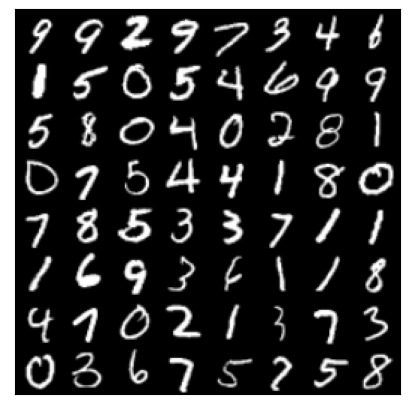

In [5]:
figsize(5,5)
big_img = stack_imgs(x.reshape([-1,C,32,32]))
plt.xticks([])
plt.yticks([])
_ = plt.imshow(big_img, cmap='gray')

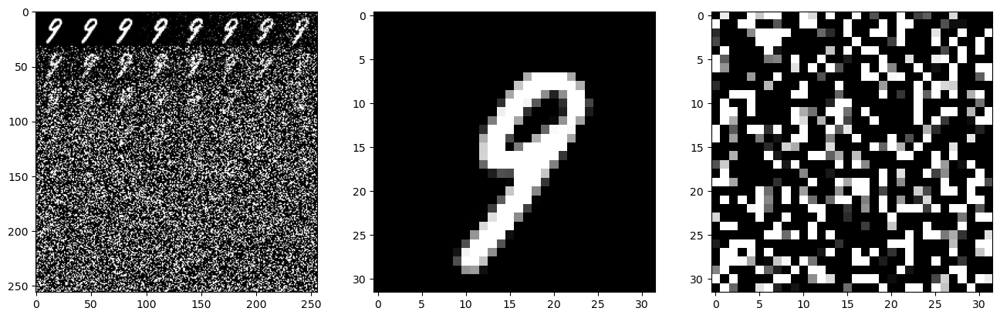

In [6]:
figsize(16,8)

batch = x[:1].repeat([64,1])
x_t, _ = q_t(batch, torch.linspace(0.0,1.0,64))
x_t = torch.clamp(x_t, 0.25, 0.75)
x_t = 2*(x_t - 0.25)

img = np.zeros([8*32,8*32])
k = 0
for k in range(64):
    i, j = k//8, k % 8
    img[i*32:(i+1)*32,j*32:(j+1)*32] = x_t[k].reshape([32,32])
plt.subplot(131)
plt.imshow(img, cmap='gray', vmin=0.0, vmax=1.0)
plt.subplot(132)
plt.imshow(img[0:32,0:32], cmap='gray', vmin=0.0, vmax=1.0)
plt.subplot(133)
plt.imshow(img[i*32:(i+1)*32,j*32:(j+1)*32], cmap='gray', vmin=0.0, vmax=1.0)

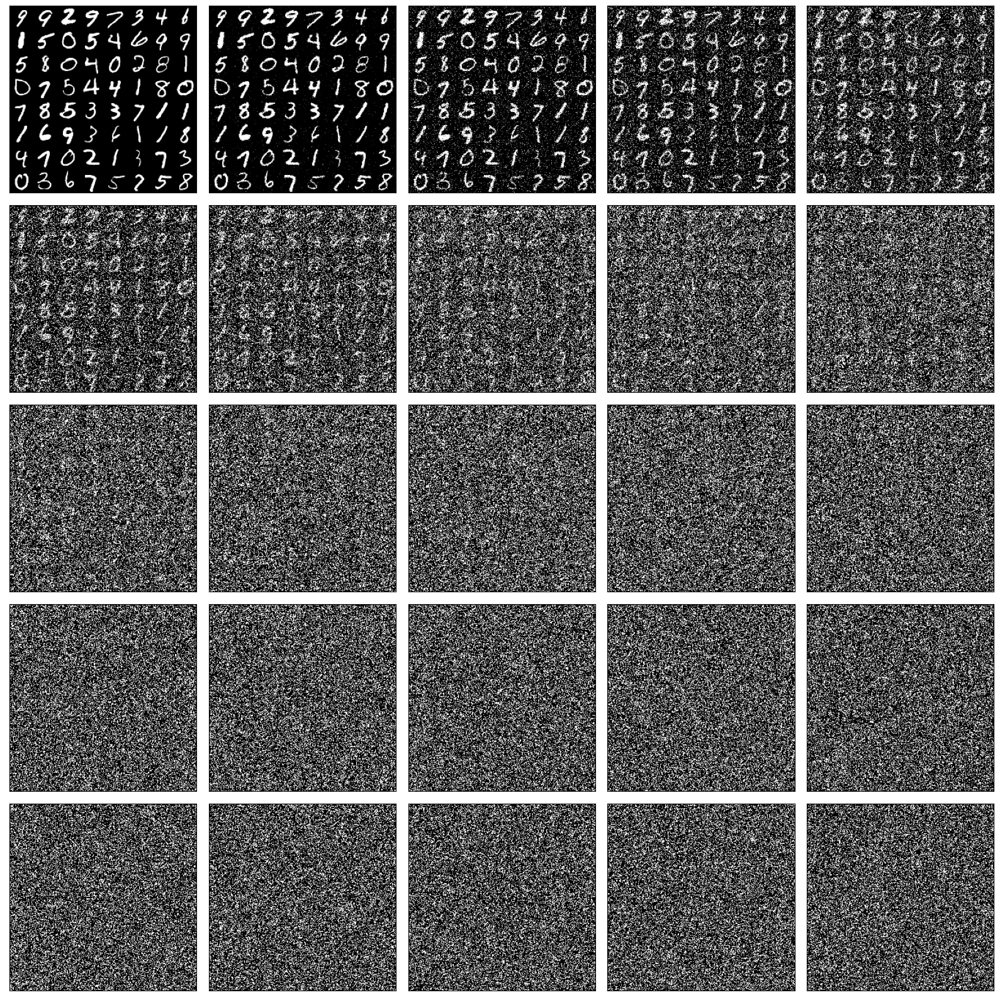

In [7]:
figsize(16,16)

t = np.linspace(0,1,25)
for i in range(5):
    for j in range(5):
        plt.subplot(5,5,5*i+j+1)
        img, _ = q_t(x, torch.ones(64)*t[5*i+j])
        img = img.reshape([-1,C,32,32])
        img = torch.clamp(img, 0.25, 0.75)
        img = 2*(img - 0.25)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(stack_imgs(img), cmap='gray', vmin=0.0, vmax=255)
plt.tight_layout()

## CelebA

In [165]:
from utils import get_dataset_CelebA as get_dataset
from configs import job_configs
config = job_configs['am_celeba_inpaint']
config.data.norm_mean = (0.0, 0.0, 0.0)
config.data.norm_std = (1.0, 1.0, 1.0)
C, C_cond, H, W = config.data.num_channels, config.model.cond_channels, config.data.image_size, config.data.image_size

device = torch.device('cuda')
train_loader, val_loader = get_dataset(config)
q_t, _, _ = get_q(config)

In [177]:
x,y = next(iter(train_loader))
x, y = x[:64], y[:64]
x = x.view(64, -1)

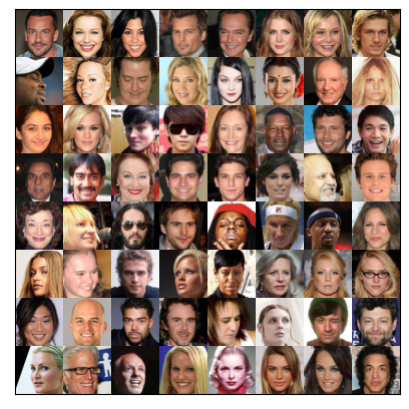

In [178]:
figsize(5,5)
big_img = stack_imgs(x.reshape([-1,C,H,W]))
plt.xticks([])
plt.yticks([])
_ = plt.imshow(big_img, cmap='gray')

In [185]:
example = torch.load('celeba_example.tensor').reshape([3,H,W])
example = example-torch.tensor(config.data.norm_mean).reshape(C,1,1)
example = example/torch.tensor(config.data.norm_std).reshape(C,1,1)
example = example.view(1,-1)

In [187]:
alpha = lambda t: 1-t
sigma = lambda t: t
w = w3
dwdt = dw3dt

def q_t(x, t):
    assert (2 == x.dim())
    B, C, H, W = x.shape[0], config.data.num_channels, config.data.image_size, config.data.image_size
    x = x.reshape([B, C, H, W])
    while (x.dim() > t.dim()): t = t.unsqueeze(-1)
    mask = torch.zeros_like(x)
    u = (torch.rand((B,1,1,1)) < 0.5).float()
    mask[:,:,:H//2,:], mask[:,:,H//2:,:] = u, 1-u
    eps = torch.randn_like(x)
    output = mask*x + (1-mask)*(sigma(t)*eps + alpha(t)*x)
    output = torch.hstack([output])
    return output.reshape([B, C*H*W]), None

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


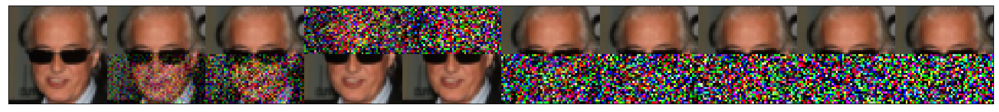

In [188]:
figsize(18,8)

n = 10

batch = example.repeat([n,1])
x_t, _ = q_t(batch, torch.linspace(0,1,n))

img = np.zeros([1*H,n*W,3])
k = 0
for k in range(n):
    i, j = k//n, k % n
#     x_t[k] = torch.clamp(x_t[k], 0.25, 0.75)
#     x_t[k] = 2*(x_t[k] - 0.25)
    cur_img = x_t[k].numpy().reshape([C+C_cond,H,W])[:C].transpose([1,2,0])
    cur_img = cur_img*np.array(config.data.norm_std).reshape(1,1,C)
    cur_img = cur_img + np.array(config.data.norm_mean).reshape(1,1,C)
    img[i*H:(i+1)*H,j*W:(j+1)*W,:] = cur_img
plt.xticks([])
plt.yticks([])
plt.imshow(img)
plt.tight_layout()
plt.savefig('example_' + config.model.task + '.png', format='png', bbox_inches='tight')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


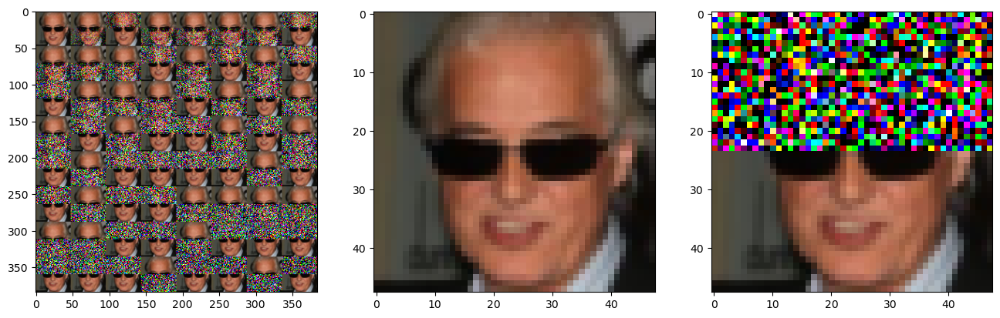

In [179]:
figsize(16,8)

# batch = x[:1].repeat([64,1])
# x_t, _ = q_t(batch, torch.linspace(0,1,64))

img = np.zeros([8*H,8*W,3])
k = 0
for k in range(64):
    i, j = k//8, k % 8
    img[i*H:(i+1)*H,j*W:(j+1)*W,:] = x_t[k].numpy().reshape([-1,H,W])[:C,:,:].transpose([1,2,0])
plt.subplot(131)
plt.imshow(img)
plt.subplot(132)
plt.imshow(img[0:H,0:W,:])
plt.subplot(133)
plt.imshow(img[i*H:(i+1)*W,j*H:(j+1)*W,:])

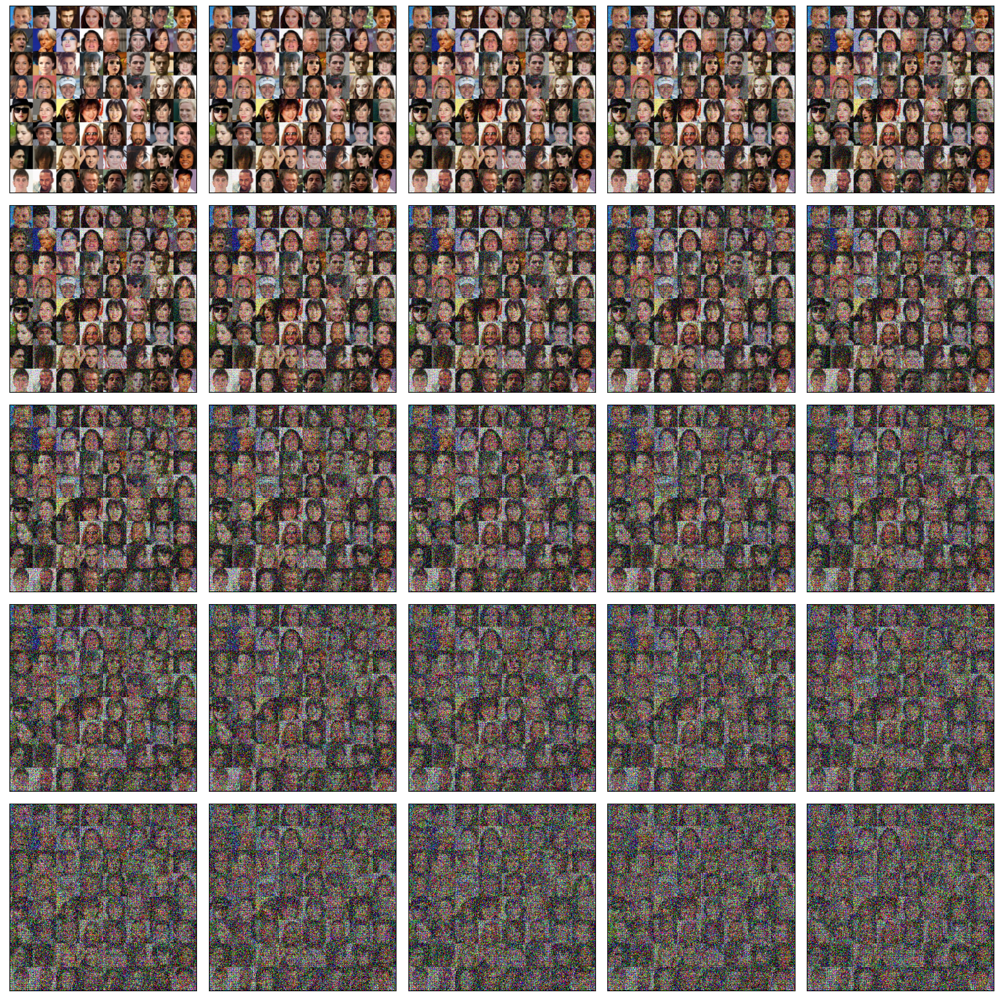

In [7]:
figsize(16,16)

t = np.linspace(0,1,25)
for i in range(5):
    for j in range(5):
        plt.subplot(5,5,5*i+j+1)
        img, _ = q_t(x, torch.ones(64)*t[5*i+j])
        img = img.reshape([-1,C + C_cond,H,W])[:,:C]
        plt.xticks([])
        plt.yticks([])
        plt.imshow(stack_imgs(img), cmap='gray', vmin=0.0, vmax=255)
plt.tight_layout()

## CIFAR

In [147]:
from utils import get_dataset_CIFAR10 as get_dataset
from configs import job_configs
config = job_configs['am_cifar_torus']
C, C_cond, H, W = config.data.num_channels, config.model.cond_channels, config.data.image_size, config.data.image_size

device = torch.device('cuda')
train_loader, val_loader = get_dataset(config)
q_t, _, _ = get_q(config)

Files already downloaded and verified
Files already downloaded and verified


In [148]:
x,y = next(iter(train_loader))
x, y = x[:64], y[:64]
x = x.view(64, -1)

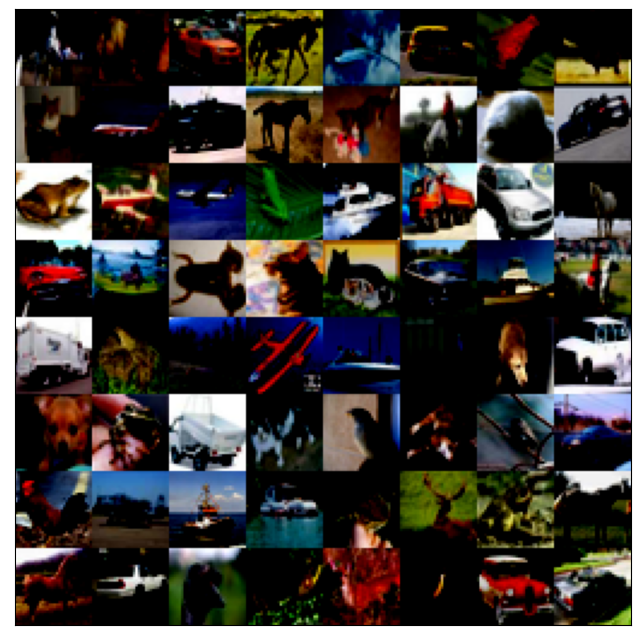

In [149]:
figsize(10,8)
big_img = stack_imgs(x.reshape([-1,C,32,32]))
plt.xticks([])
plt.yticks([])
_ = plt.imshow(big_img)

In [150]:
example = torch.load('example_image.tensor').reshape([3,32,32])
example = example-torch.tensor(config.data.norm_mean).reshape(C,1,1)
example = example/torch.tensor(config.data.norm_std).reshape(C,1,1)
example = example.view(1,-1)

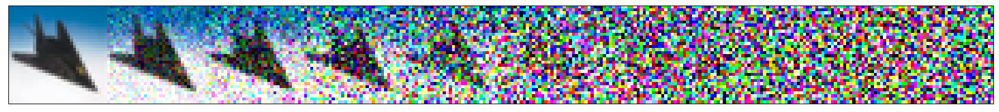

In [164]:
figsize(18,8)

n = 10

batch = example.repeat([n,1])
x_t, _ = q_t(batch, torch.linspace(0,1,n))

img = np.zeros([1*32,n*32,3])
k = 0
for k in range(n):
    i, j = k//n, k % n
    x_t[k] = torch.clamp(x_t[k], 0.25, 0.75)
    x_t[k] = 2*(x_t[k] - 0.25)
    cur_img = x_t[k].numpy().reshape([C+C_cond,32,32])[:C].transpose([1,2,0])
#     cur_img = cur_img*np.array(config.data.norm_std).reshape(1,1,C)
#     cur_img = cur_img + np.array(config.data.norm_mean).reshape(1,1,C)
    img[i*32:(i+1)*32,j*32:(j+1)*32,:] = cur_img
plt.xticks([])
plt.yticks([])
plt.imshow(img)
plt.tight_layout()
plt.savefig('example_' + config.model.task + '.png', format='png', bbox_inches='tight')

In [99]:
figsize(16,8)

batch = example.repeat([64,1])
x_t = q_t(batch, torch.linspace(0,1,64))
x_t = torch.clamp(x_t, 0.25, 0.75)
x_t = 2*(x_t - 0.25)

img = np.zeros([8*32,8*32,3])
k = 0
for k in range(64):
    i, j = k//8, k % 8
    img[i*32:(i+1)*32,j*32:(j+1)*32,:] = x_t[k].numpy().reshape([3,32,32]).transpose([1,2,0])
plt.subplot(131)
plt.imshow(img)
plt.subplot(132)
plt.imshow(img[0:32,0:32,:])
plt.subplot(133)
plt.imshow(img[i*32:(i+1)*32,j*32:(j+1)*32,:])

TypeError: clamp() received an invalid combination of arguments - got (tuple, float, float), but expected one of:
 * (Tensor input, Tensor min, Tensor max, *, Tensor out)
 * (Tensor input, Number min, Number max, *, Tensor out)


AttributeError: 'tuple' object has no attribute 'reshape'

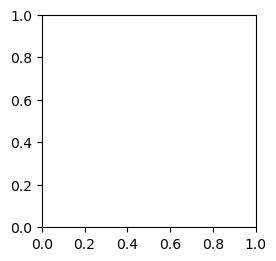

In [100]:
figsize(16,16)

t = np.linspace(0,1,25)
for i in range(5):
    for j in range(5):
        plt.subplot(5,5,5*i+j+1)
        img = q_t(x, torch.ones(64)*t[5*i+j])
        img = img.reshape([-1,C,32,32])
        img = torch.clamp(img, 0.25, 0.75)
        img = 2*(img - 0.25)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(stack_imgs(img))
plt.tight_layout()